# 4.0.0-Integration

**Inés Sentís**

Date of execution 

In [1]:
Sys.Date()

[1] "2025-01-27"

## Introduction

Integrate all fractions together 

## Libraries

In [2]:
options(warn = -1, verbose = FALSE)
suppressMessages(suppressWarnings({
library(Seurat)
library(here)
library(glue)
library(tidyverse)
library(ggplot2)
library(cowplot)
library(dplyr)
library(harmony)
library(dittoSeq)
library(scater) 
library(scran)}))

In [3]:
source(here::here("utils/bin.R"))
source(here::here("utils/style.R"))
source(here::here("SCGRES_124_125/sc_analysis/misc/paths.R"))

"{annot}/{plt_dir}" %>%
  glue::glue() %>%
  here::here() %>%
  dir.create(path = .,
           showWarnings = FALSE,
           recursive = TRUE)

"{annot}/{robj_dir}" %>%
  glue::glue() %>%
  here::here() %>%
  dir.create(path = .,
           showWarnings = FALSE,
           recursive = TRUE)

set.seed(0)

## Load data

In [4]:
seurat_obj <- readRDS(here(glue("{annot}/{robj_dir}/4.0.0-Integration_Exp2.rds")))

## Remove Cells

In [5]:
seurat_obj <- subset(x = seurat_obj, idents=c(11), invert=TRUE)

In [6]:
seurat_obj <- DietSeurat(
  seurat_obj,
  counts = TRUE,
  data = TRUE,
  scale.data = FALSE,
  features = NULL,
  assays = NULL,
  dimreducs = FALSE,
  graphs = NULL
)

In [7]:
print(table(rowSums(as.matrix(seurat_obj[['RNA']]@counts)) == 0))
  
keep_genes <- data.frame(rowSums(as.matrix(seurat_obj[['RNA']]@counts)) != 0)
colnames(keep_genes) <- "logical"
keep_genes <- subset(keep_genes, logical==TRUE)
seurat_obj[['RNA']]@counts <- seurat_obj[['RNA']]@counts[rownames(keep_genes), ]
seurat_obj[['RNA']]@data <- seurat_obj[['RNA']]@data[rownames(keep_genes), ]
seurat_obj


FALSE  TRUE 
28020    78 


An object of class Seurat 
28020 features across 21819 samples within 1 assay 
Active assay: RNA (28020 features, 1381 variable features)

## Re-do embedding and clustering

In [8]:
list_objects <- SplitObject(seurat_obj, split.by = "sample_id")

In [9]:
find_hvgs <-  function(name,obj) {
    
    # normalize again
    obj <- obj %>% 
            NormalizeData(
                normalization.method = "LogNormalize",
                scale.factor = 1e4) 
    
    # compute the variance and mean of the log-expression values 
    sce <- as.SingleCellExperiment(obj)
    gene_var <- modelGeneVar(sce)
    
    tops <- gene_var %>% 
        as.data.frame() %>% 
        arrange(desc(total)) %>% 
        head(n=20)

    plt <- gene_var %>% 
      as.data.frame() %>% 
      ggplot(aes(mean, total)) +
      geom_point() +
      geom_line(aes(y = tech), colour = "dodgerblue", size = 1) +
      labs(title = name, x = "Mean of log-expression", y = "Variance of log-expression") +
      geom_text(data=tops, aes(mean,total,label=rownames(tops))) +
      theme(plot.title = element_text(hjust = 0.5, size = 14, face = "bold"))

    hvgs <- getTopHVGs(gene_var,fdr.threshold = 0.1)
    return(list(plot = plt, hvgs_frac = hvgs))
}

In [10]:
modelling <- lapply(names(list_objects), function(name) {
    find_hvgs(name, list_objects[[name]])})

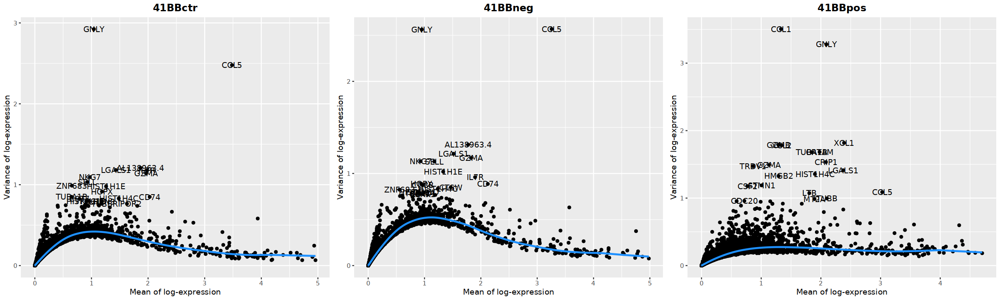

In [11]:
options(repr.plot.width = 20, repr.plot.height =6, warn=-1,verbose = FALSE)
# show plots
cp <- cowplot::plot_grid(plotlist = list(modelling[[1]]$plot, modelling[[2]]$plot, modelling[[3]]$plot),
                   align = "hv",
                   axis = "trbl",
                   ncol = 3,
                   nrow = 1)
cp

In [12]:
list_hvg <- lapply(modelling, function(el) {
    el$hvgs_frac
})

In [13]:
## Join modulation HVGs 
# normalize again
seurat_obj <- seurat_obj %>% 
            NormalizeData(
                normalization.method = "LogNormalize",
                scale.factor = 1e4) 
    
# compute the variance and mean of the log-expression values 
sce <- as.SingleCellExperiment(seurat_obj)
gene_var <- modelGeneVar(sce, block=seurat_obj$sample_id)
    
tops <- gene_var %>% 
        as.data.frame() %>% 
        arrange(desc(total)) %>% 
        head(n=20)

hvgs <- getTopHVGs(gene_var,fdr.threshold = 0.1)

selected <- gene_var[hvgs,]

plt <- gene_var %>% 
      as.data.frame() %>% 
      ggplot(aes(mean, total)) +
      geom_point() +
      geom_line(aes(y = tech), colour = "dodgerblue", size = 1) +
      labs(title = "All fractions", x = "Mean of log-expression", y = "Variance of log-expression") +
      geom_text(data=tops, aes(mean,total,label=rownames(tops))) +
      theme(plot.title = element_text(hjust = 0.5, size = 14, face = "bold"))

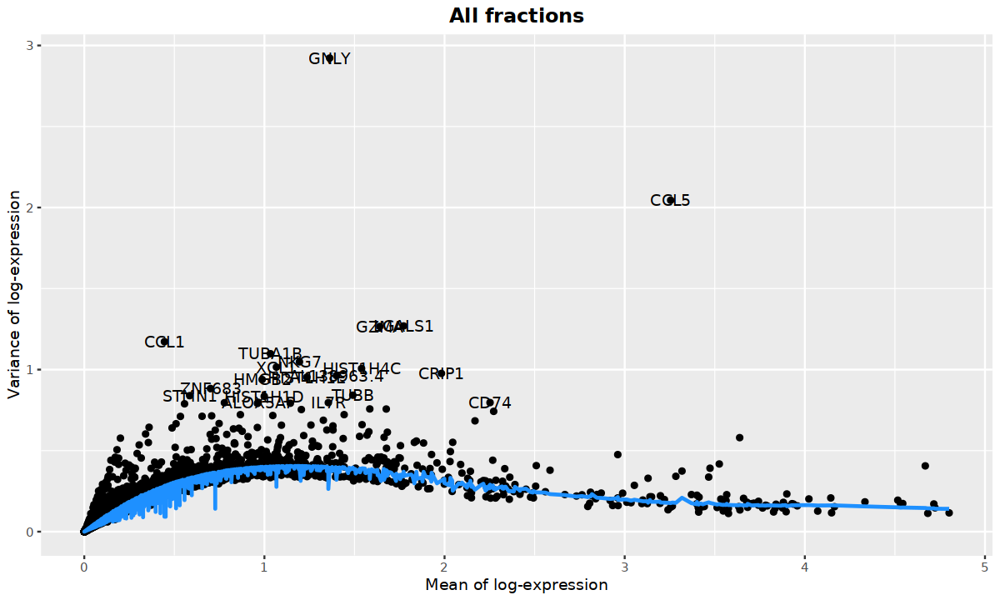

In [14]:
options(repr.plot.width = 10, repr.plot.height =6, warn=-1,verbose = FALSE)
plt

In [15]:
hvgs <- hvgs[!grepl("^TR[AB][VJC]", hvgs)]
length(hvgs)

[1] 1749

In [16]:
VariableFeatures(seurat_obj) <- hvgs

In [17]:
seurat_obj <- seurat_obj %>%
  ScaleData(features=hvgs) %>% 
  RunPCA(features=hvgs)

Centering and scaling data matrix

PC_ 1 
Positive:  TOP2A, UBE2C, ASPM, KIFC1, RRM2, CDK1, GTSE1, DLGAP5, MKI67, BIRC5 
	   KNL1, NUSAP1, CKAP2L, NCAPG, CENPF, TPX2, CDCA2, CDCA8, KIF15, HJURP 
	   HMMR, SPC25, CCNB2, KIF23, DIAPH3, CDCA3, STMN1, KIF4A, CDKN3, KIF2C 
Negative:  TPT1, RPL10, FTL, IL7R, RPS8, LTB, GIMAP7, TXNIP, ISG20, FCMR 
	   RIPOR2, S1PR1, TC2N, IFITM1, RPS6, SELL, AC119396.1, EEF1B2, P2RY8, LEF1 
	   AQP3, AL138963.4, CCR7, NOSIP, GIMAP4, S100A4, CD27, LINC00861, PASK, IFITM2 
PC_ 2 
Positive:  IFITM1, TPT1, IL7R, GIMAP7, RIPOR2, SELL, S1PR1, LEF1, IFITM2, TC2N 
	   HJURP, RPL10, ANLN, MXD3, ARHGAP15, P2RY8, CKAP2L, CIT, CDK1, HIST1H3B 
	   KIF23, KIFC1, CDCA3, KNL1, HIST1H3C, AC119396.1, TOP2A, KIF14, KIF15, AL138963.4 
Negative:  TNFRSF9, CRTAM, SEMA4A, TIE1, EBI3, CCL1, EGR2, TNFRSF4, LINC02341, XCL2 
	   GZMB, MB, AFAP1L2, XCL1, CSF2, FABP5, AHI1, DUSP4, SQLE, RGS16 
	   CD82, ENTPD1, TIGIT, SDC4, SMS, LAIR2, GEM, RBPJ, CLNK, SRGN 
PC_ 3 
Positive:  CST7, CCL5,

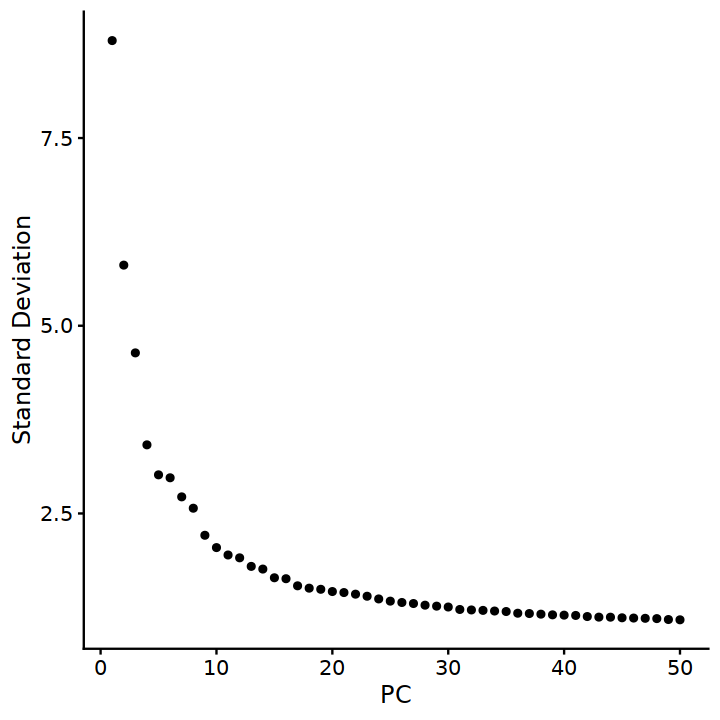

In [18]:
options(repr.plot.width = 6, repr.plot.height = 6, warn=-1,verbose = FALSE)
ElbowPlot(seurat_obj, n=50)

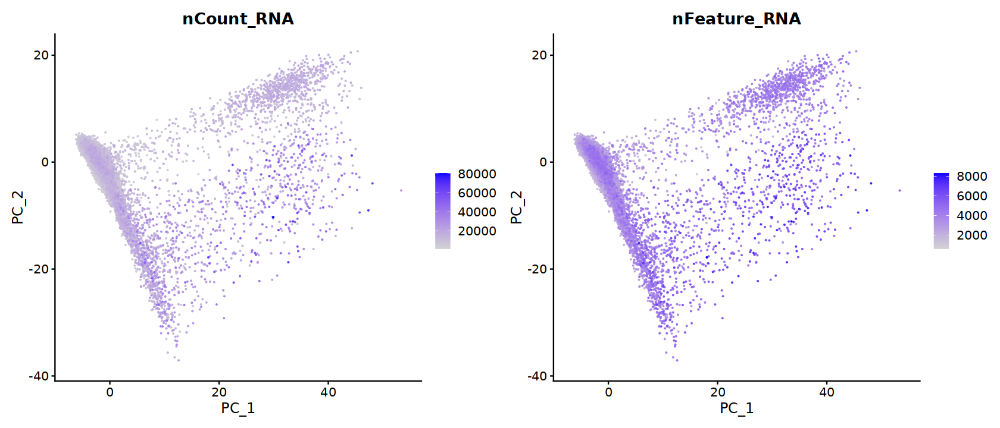

In [19]:
options(repr.plot.width = 14, repr.plot.height = 6)
FeaturePlot(object = seurat_obj, reduction = "pca",
    features = c("nCount_RNA", "nFeature_RNA"), order = T)

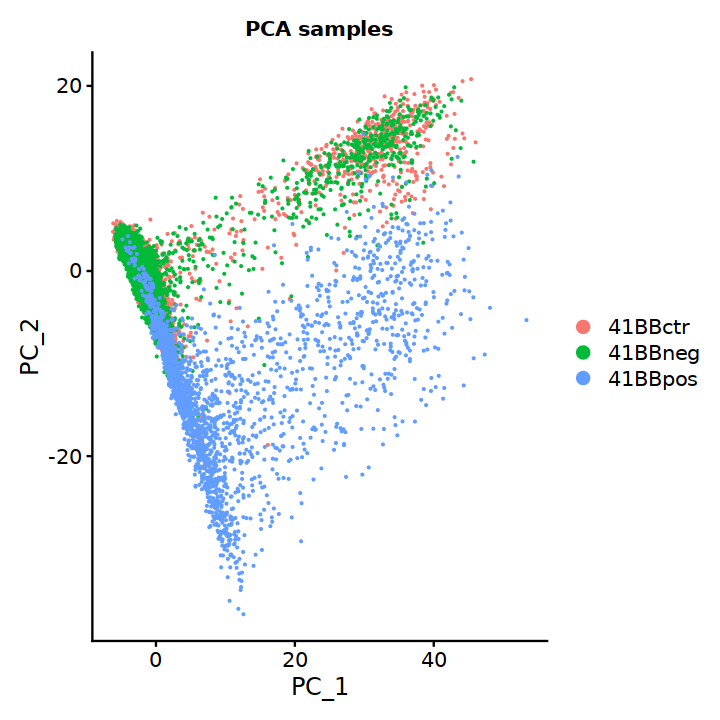

In [20]:
options(repr.plot.width = 6, repr.plot.height = 6, warn=-1,verbose = FALSE)
dp1 <- DimPlot(
  seurat_obj,
  reduction = "pca",
  group.by = "sample_id",
  pt.size = 0.1
) + ggtitle('PCA samples') + 
    theme(plot.title = element_text(hjust = 0.5, size = 12, face = "bold"))
dp1

In [21]:
comp=20

In [22]:
seurat_obj <- RunUMAP(
  seurat_obj,
  dims = 1:comp,
  reduction = "pca",
  reduction.name = "umap",
  reduction.key = "UMAP_"
)

17:25:14 UMAP embedding parameters a = 0.9922 b = 1.112

17:25:14 Read 21819 rows and found 20 numeric columns

17:25:14 Using Annoy for neighbor search, n_neighbors = 30

17:25:14 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

17:25:16 Writing NN index file to temp file /scratch_tmp/34461493/RtmprToGoq/file2084616edd28f

17:25:16 Searching Annoy index using 1 thread, search_k = 3000

17:25:23 Annoy recall = 100%

17:25:24 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

17:25:25 Initializing from normalized Laplacian + noise (using irlba)

17:25:26 Commencing optimization for 200 epochs, with 942524 positive edges

17:25:50 Optimization finished



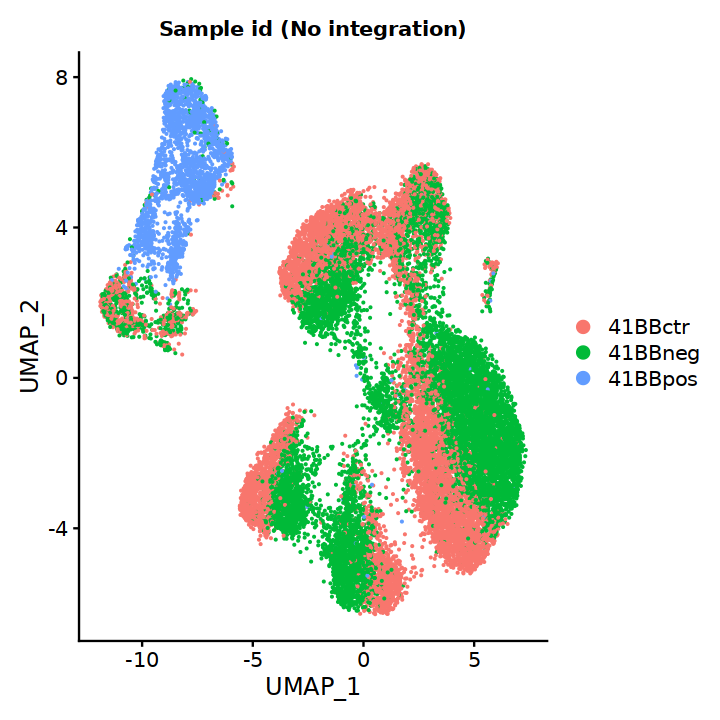

In [23]:
options(repr.plot.width = 6, repr.plot.height = 6, warn=-1,verbose = FALSE)
dpt <- DimPlot(
  seurat_obj,
  reduction = "umap",
  group.by = "sample_id",
    shuffle = T,
  pt.size = 0.1
) + ggtitle('Sample id (No integration)') + 
     theme(plot.title = element_text(hjust = 0.5, size = 12, face = "bold"))

dpt 

Between control and negative fraction there is a bit of batch effect but according to downstream clustering those look like the same populations of T cells

## Clustering

In [24]:
# Find the K-nearest neighbors
seurat_obj <- FindNeighbors(seurat_obj, reduction = "pca", dims = 1:comp)
# Find clusters at different resolutions
clusters_df <- cluster_diff_resolutions(
  seurat_obj = seurat_obj,
  min_resolution = 0.1,
  max_resolution = 1.0,
  step = 0.05
)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 21819
Number of edges: 706459

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9593
Number of communities: 6
Elapsed time: 3 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 21819
Number of edges: 706459

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9490
Number of communities: 8
Elapsed time: 4 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 21819
Number of edges: 706459

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9399
Number of communities: 9
Elapsed time: 3 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 21819
Number of edges: 706459

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9312
Number of communities: 9
Elapsed time: 3 seconds
Modularity Optim

In [25]:
list_plots <- lapply(unique(clusters_df$resolution), function(x) {
  p <- add_reso_results(seurat_obj, clusters_df, resolution=x)
  umap <- DimPlot(p, reduction = "umap", 
                  group.by=glue::glue("seurat_clusters")) +
    labs(title=glue::glue("Resolution {x}"))
  return(umap)
})

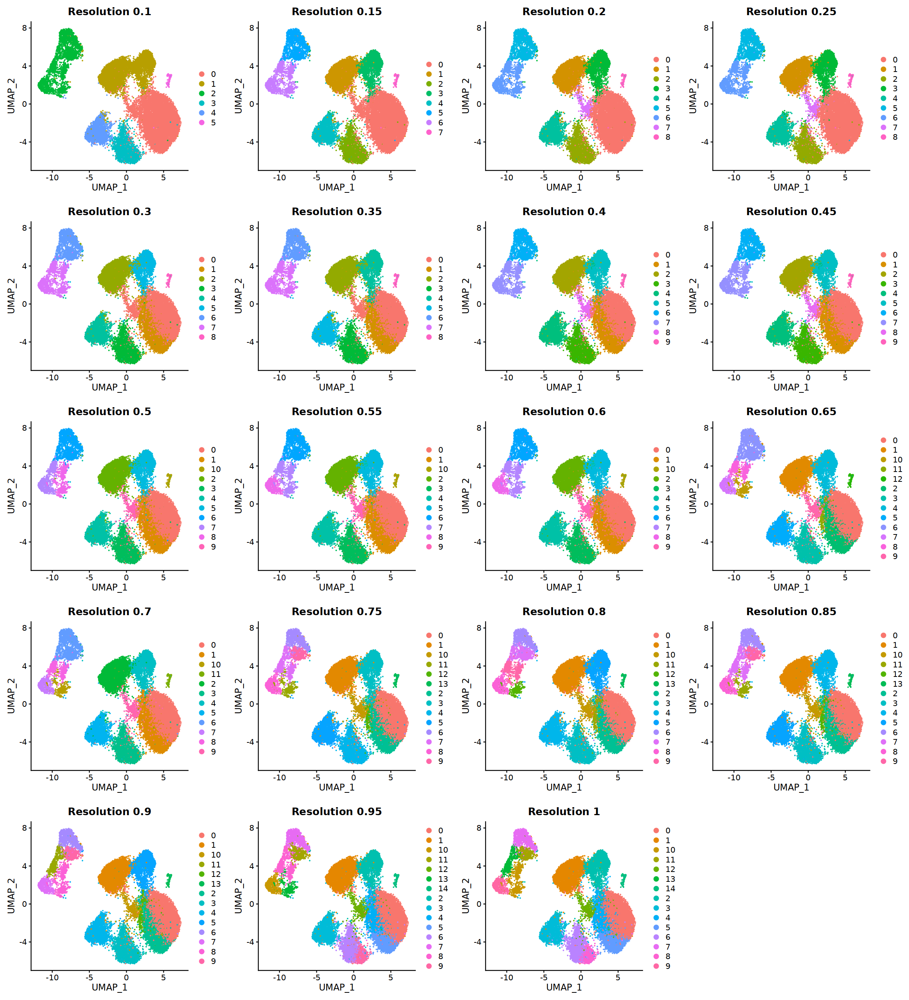

In [26]:
options(repr.plot.width = 20, repr.plot.height = 22, warn=-1,verbose = FALSE)
cp <- cowplot::plot_grid(plotlist = list_plots,
                   align = "hv",
                   axis = "trbl",
                   ncol=4,
                   nrow=5)
cp

In [27]:
tcell_markers = c("CD3E","CD3D", "CD4", "CD8A","CD8B","ANXA1",
                  "NKG7", "GNLY","PRF1","ICOS","FOXP3","CXCR3", 
                  "GATA3","RORA","SELL", "LEF1", "NCAM1", "FCGR3A",
                  "TRDC", "TRGC1","TRGC2", "KIT", "CD34","ZNF683", 
                  "CX3CR1", "ITGAE")

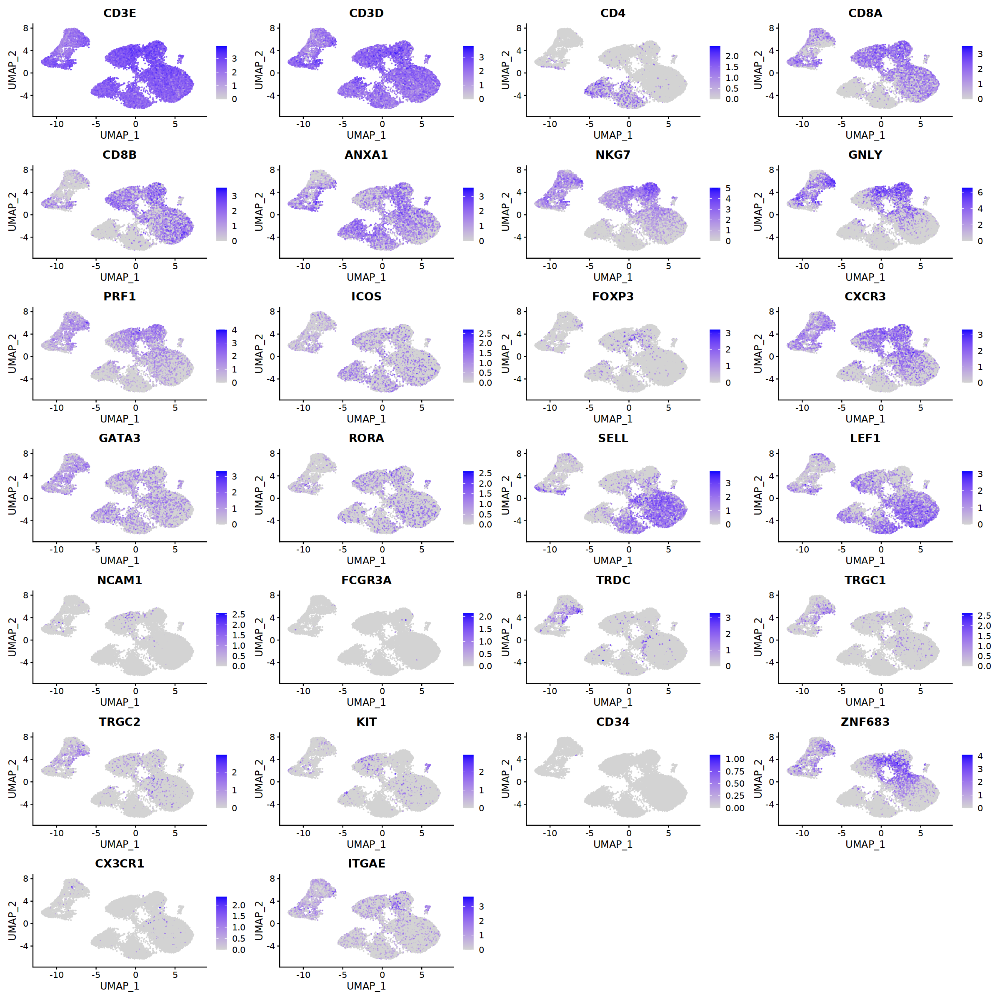

In [28]:
options(repr.plot.width = 20, repr.plot.height = 20, warn=-1,verbose = FALSE)
FeaturePlot(seurat_obj, reduction = "umap", 
            feature= tcell_markers, 
            order = F, ncol=4)

### Resolution chosen

In [29]:
reso=0.25

In [30]:
seurat_obj <- FindClusters(seurat_obj, resolution = reso)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 21819
Number of edges: 706459

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9312
Number of communities: 9
Elapsed time: 3 seconds


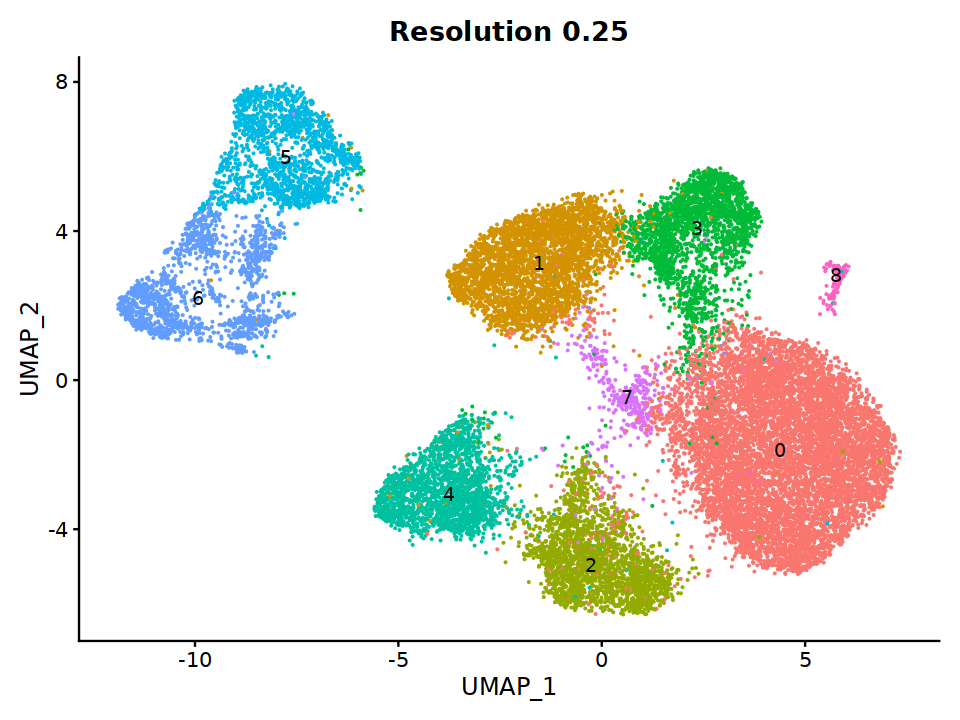

In [31]:
options(repr.plot.width = 8, repr.plot.height = 6, warn=-1,verbose = FALSE)
DimPlot(seurat_obj, reduction = "umap", label = T)+ NoLegend() +
  labs(title=glue("Resolution {reso}")) + theme(plot.title = element_text(hjust = 0.5))


In [32]:
rna.markers <- FindAllMarkers(seurat_obj, min.pct=0.1, logfc.threshold=0.1, 
                              random.seed=0, max.cells.per.ident=2000, 
                              only.pos=TRUE)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8



In [33]:
rna.markers <- rna.markers %>% 
  dplyr::filter(p_val_adj < 0.05) %>% 
  arrange(desc(avg_log2FC))

In [34]:
write.csv(rna.markers, 
          here(glue("{annot}/{robj_dir}/4.0.1-Annotation_Exp2.csv")), 
          row.names=TRUE)

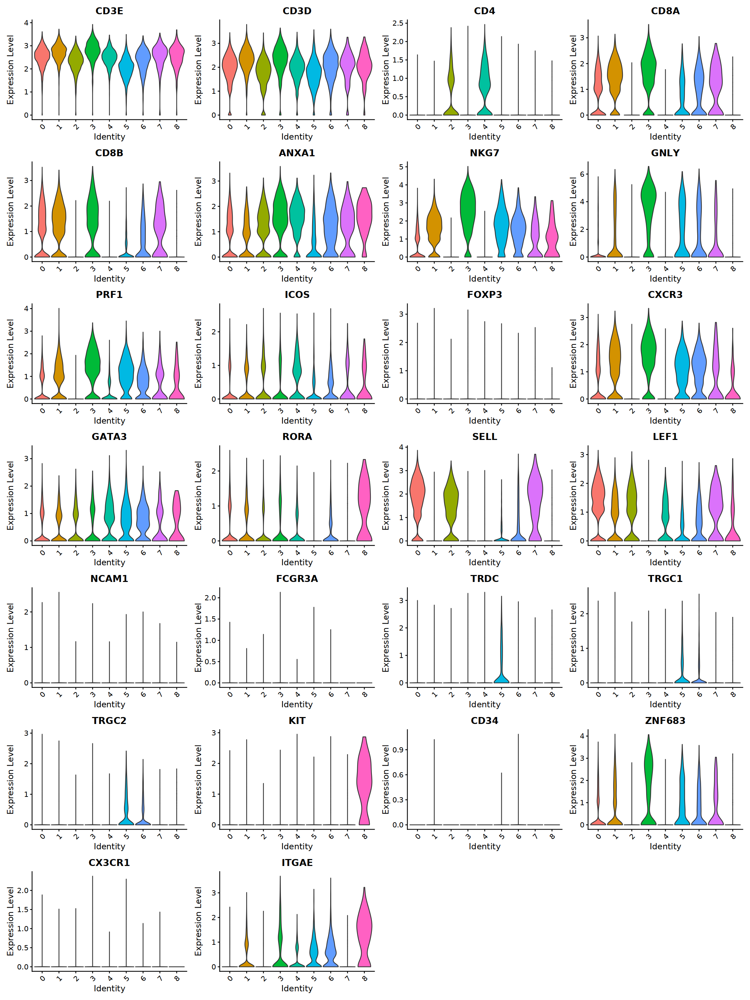

In [35]:
options(repr.plot.width = 18, repr.plot.height = 24, warn=-1,verbose = FALSE)
VlnPlot(seurat_obj, pt.size = 0,
            feature=tcell_markers, 
             ncol=4)

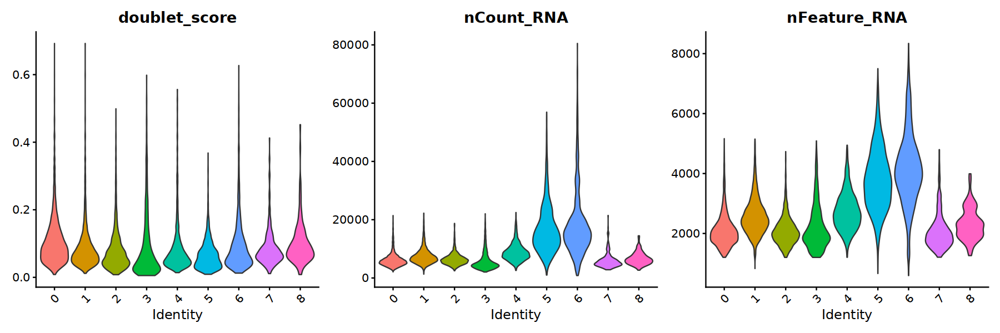

In [36]:
options(repr.plot.width = 15, repr.plot.height = 5, warn=-1,verbose = FALSE)
VlnPlot(seurat_obj,feature=c("doublet_score", "nCount_RNA", "nFeature_RNA"), 
            ncol=3, pt.size = 0)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 1649
Number of edges: 53211

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9149
Number of communities: 2
Elapsed time: 0 seconds


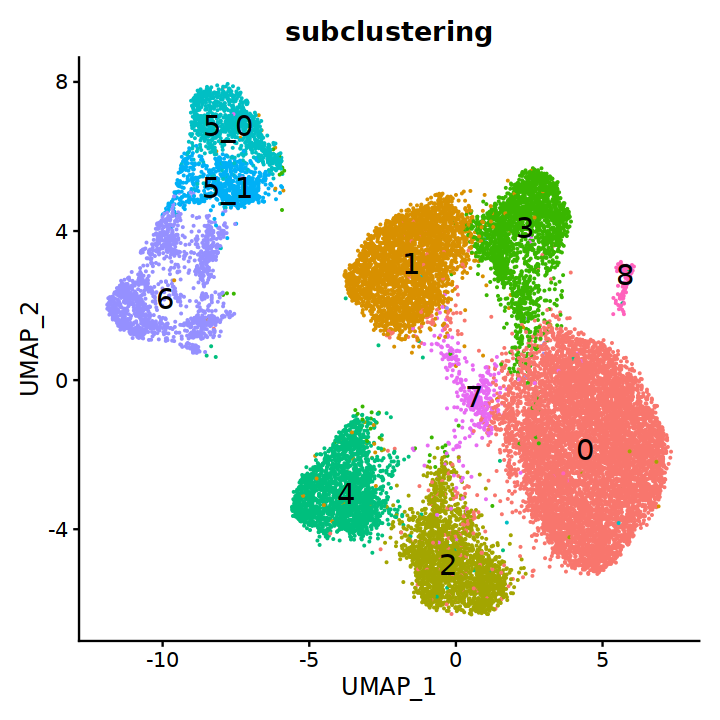

In [37]:
options(repr.plot.width = 6, repr.plot.height = 6, warn=-1,verbose = FALSE)
seurat_obj <- FindSubCluster(
  seurat_obj,
  c("5"),
  graph.name = "RNA_snn",
  subcluster.name = "subclustering",
  resolution = 0.1,
  algorithm = 1
)

pc <- DimPlot(seurat_obj, reduction = "umap", 
        group.by = "subclustering", label = TRUE, label.size = 6) + NoLegend()
pc

In [38]:
seurat_obj <- SetIdent(seurat_obj, value=seurat_obj@meta.data$subclustering)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 1513
Number of edges: 46612

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9342
Number of communities: 3
Elapsed time: 0 seconds


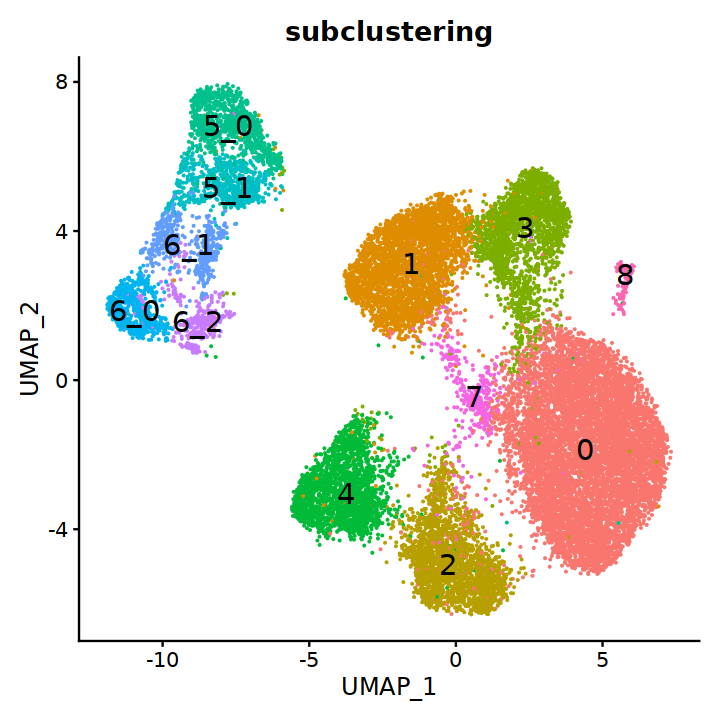

In [39]:
options(repr.plot.width = 6, repr.plot.height = 6, warn=-1,verbose = FALSE)
seurat_obj <- FindSubCluster(
  seurat_obj,
  c("6"),
  graph.name = "RNA_snn",
  subcluster.name = "subclustering",
  resolution = 0.1,
  algorithm = 1
)

pc <- DimPlot(seurat_obj, reduction = "umap", 
        group.by = "subclustering", label = TRUE, label.size = 6) + NoLegend()
pc

In [40]:
seurat_obj <- SetIdent(seurat_obj, value=seurat_obj@meta.data$subclustering)

In [41]:
rna.markers <- FindAllMarkers(seurat_obj, min.pct=0.1, logfc.threshold=0.1, 
                              random.seed=0, max.cells.per.ident=2000, 
                              only.pos=FALSE)

Calculating cluster 0

Calculating cluster 8

Calculating cluster 3

Calculating cluster 4

Calculating cluster 2

Calculating cluster 1

Calculating cluster 6_0

Calculating cluster 6_2

Calculating cluster 5_0

Calculating cluster 5_1

Calculating cluster 6_1

Calculating cluster 7



In [42]:
rna.markers <- rna.markers %>% 
  dplyr::filter(p_val_adj < 0.05) %>% 
  arrange(desc(avg_log2FC))

write.csv(rna.markers, 
          here(glue("{annot}/{robj_dir}/4.0.1-Reclustering_Exp2.csv")), 
          row.names=TRUE)

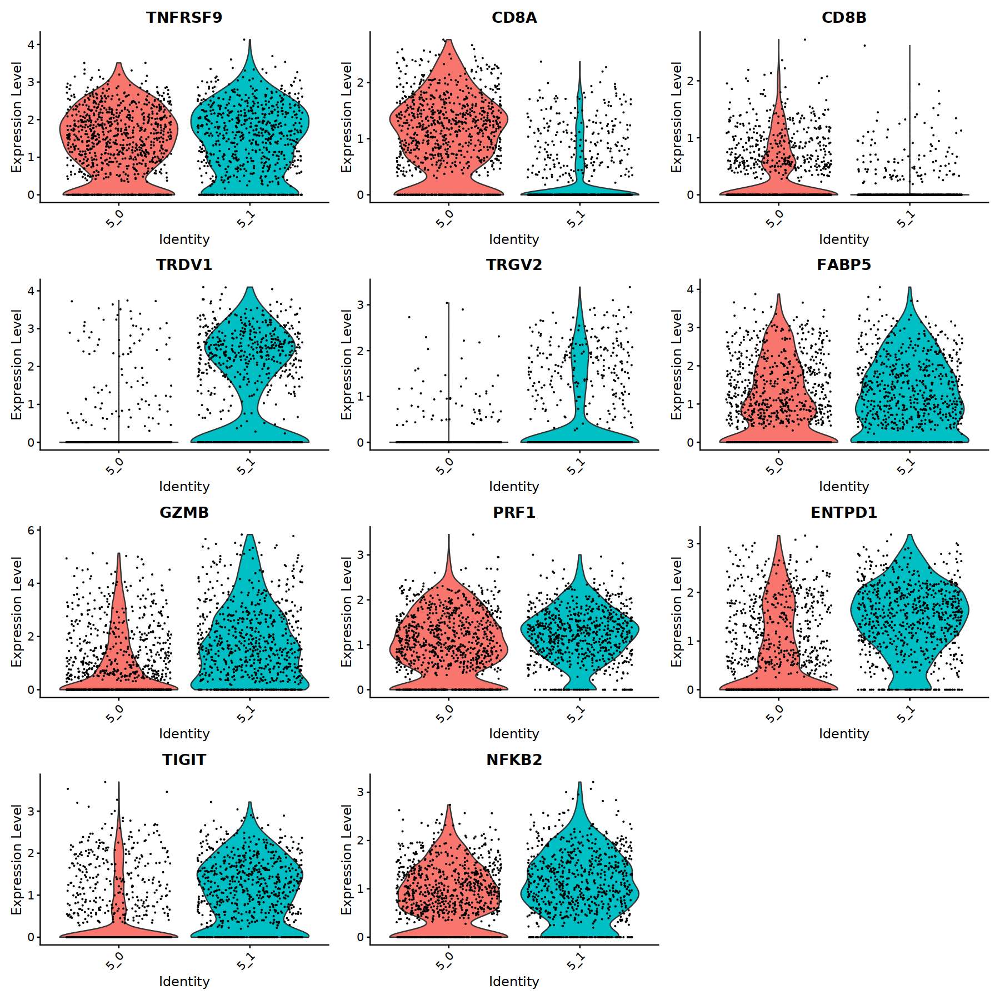

In [43]:
options(repr.plot.width = 15, repr.plot.height = 15, warn=-1,verbose = FALSE)
VlnPlot(seurat_obj, ident=c("5_0", "5_1"),
            feature=c("TNFRSF9", "CD8A", "CD8B", "TRDV1","TRGV2",
                      "FABP5", "GZMB","PRF1", "ENTPD1", "TIGIT", "NFKB2"), ncol=3)

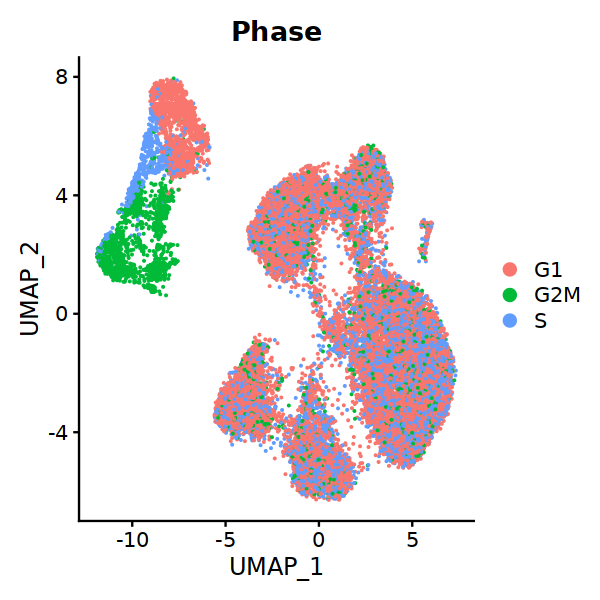

In [44]:
options(repr.plot.width = 5, repr.plot.height = 5, warn=-1,verbose = FALSE)
DimPlot(seurat_obj, group.by="Phase")

In [45]:
colnames(seurat_obj@meta.data)

[1] "orig.ident"       "nCount_RNA"       "nFeature_RNA"     "sample_id"       
 [5] "pct_mt"           "percent.ribo"     "doublet_score"    "doublet_pred"    
 [9] "S.Score"          "G2M.Score"        "Phase"            "clusters"        
[13] "RNA_snn_res.0.25" "seurat_clusters"  "subclustering"

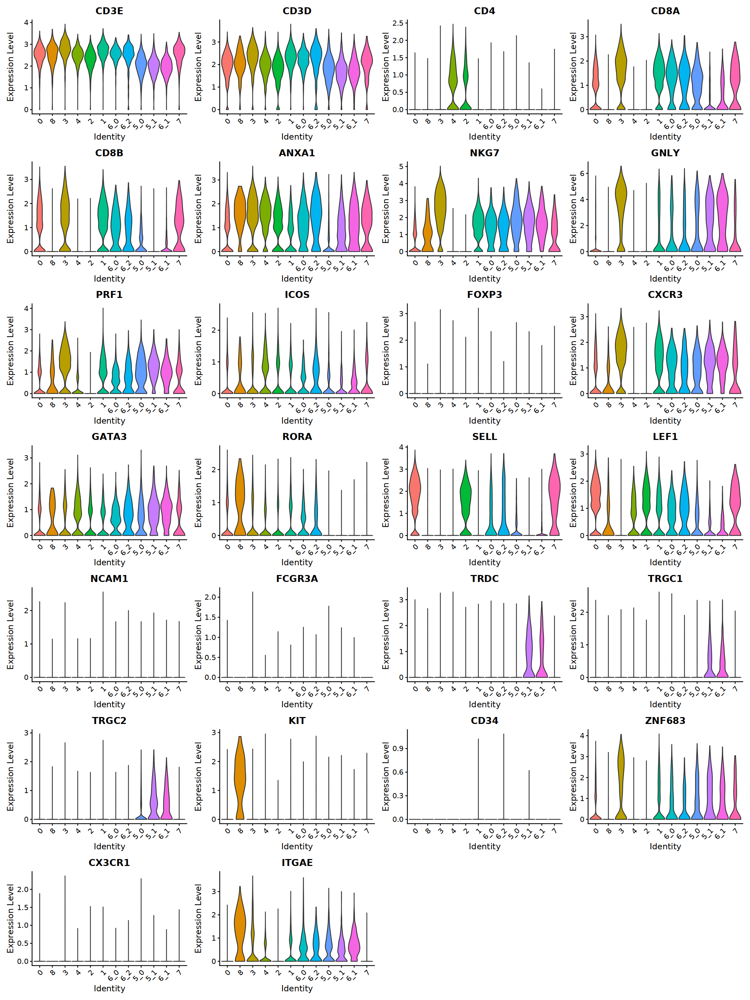

In [46]:
options(repr.plot.width = 18, repr.plot.height = 24, warn=-1,verbose = FALSE)
VlnPlot(seurat_obj, pt.size = 0,
            feature=tcell_markers, 
             ncol=4)

In [47]:
seurat_obj$clusters <- Idents(seurat_obj)

## Annotation

In [48]:
custom_pal = c("0"="#80e5ffff",
               "1"="#87ceebff",
               "2"='#41ae76',
               "3"="#003380ff",
               "4"='#89a02cff',
               "5_0"="#5599ffff",
               "5_1"="#6c5353ff",
               "6_0"="#7bccc4",
               "6_1"="#6f8a91ff",
               "6_2"="#7ba6cc",
               "7"="#006680ff",
               "8"="#808080ff")

In [49]:
generate_color <- function(names_list) {
  colors <- ifelse(names_list %in% c("3", "7"), "white", "black")
  return(colors)
}

color_labels <- generate_color(unique(Idents(seurat_obj)))

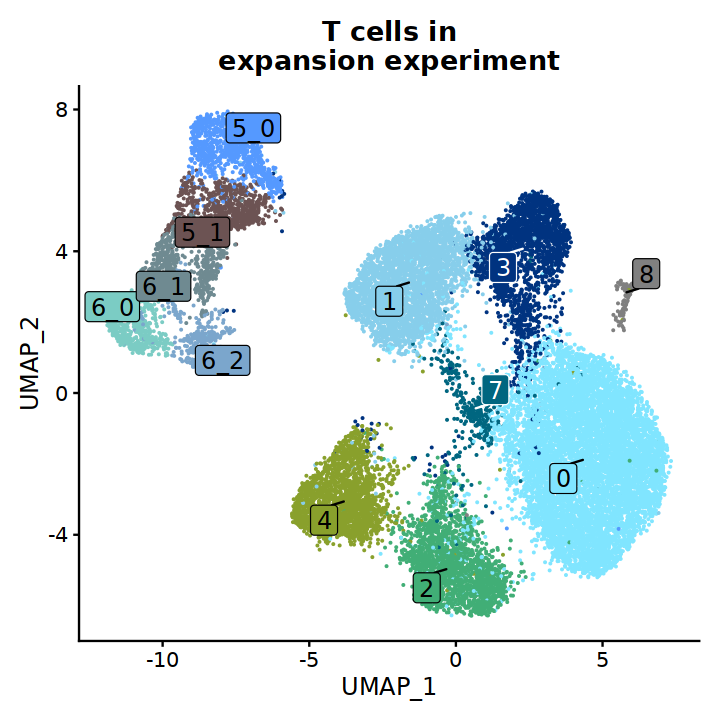

In [50]:
options(repr.plot.width = 6, repr.plot.height = 6, warn=-1,verbose = FALSE)
p_clust <- DimPlot(seurat_obj, reduction = "umap", 
                   label=T, cols=custom_pal,
                   label.box = TRUE,
                   label.size = 5,
                   label.color = as.list(color_labels),
                   repel = TRUE)+ 
  labs(title=glue("T cells in\nexpansion experiment")) + theme(plot.title = element_text(hjust = 0.5),
                                             legend.position = "right")+NoLegend()
p_clust

In [51]:
ggsave(plot = p_clust, width = 6, height = 6, dpi = 300, 
       file = here::here(glue::glue("{annot}/{plt_dir}/4.0.1-umap_tcells_exp.png")))

In [52]:
rename_clusters= list("0"="Naive CD8",
                     "1"="Effector Hobit CD8",
                     "2"="Effector CD4",
                     "3"="Cytotoxic CD8",
                     "4"="T-helpers",
                     "5_0"="41BB CD8",
                     "5_1"="41BB γδv1 T cells",
                     "6_0"="Proliferative CD8",
                     "6_1"="41BB Prolif.",
                     "6_2"="Prolif. cytotoxic CD8",
                     "7"="IFN-response CD8",
                     "8"="MAIT")
seurat_obj <- RenameIdents(object = seurat_obj, rename_clusters)
seurat_obj$annot <- Idents(seurat_obj)

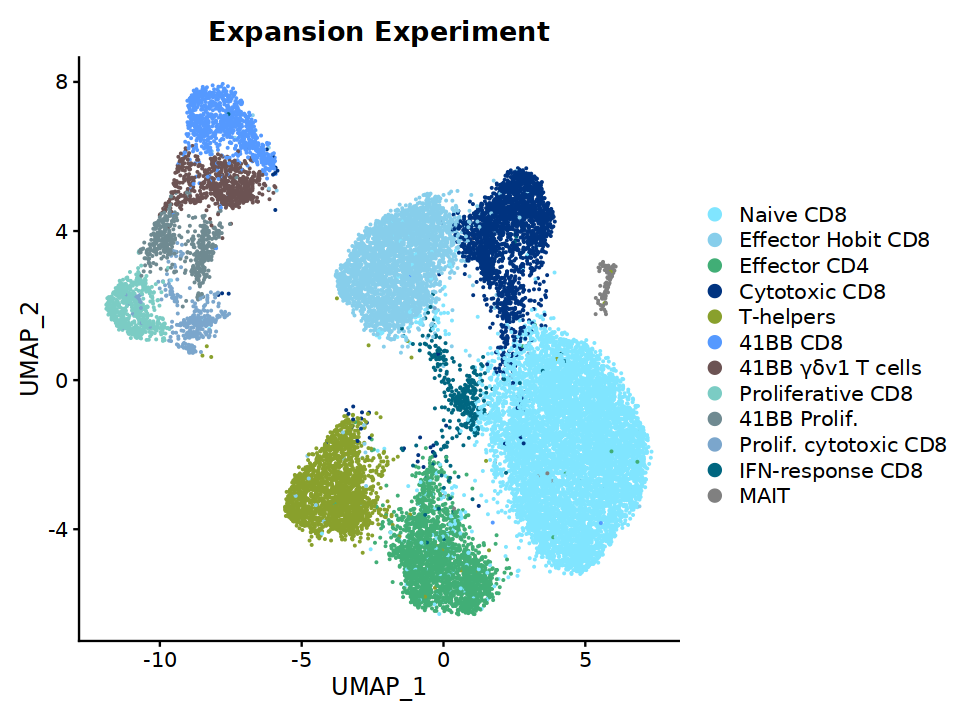

In [53]:
options(repr.plot.width = 8, repr.plot.height = 6, warn=-1,verbose = FALSE)
p_clust <- DimPlot(seurat_obj, reduction = "umap", 
                   label=F, cols=exp_pal)+ 
  labs(title=glue("Expansion Experiment")) + theme(plot.title = element_text(hjust = 0.5),
                                             legend.position = "right")
p_clust

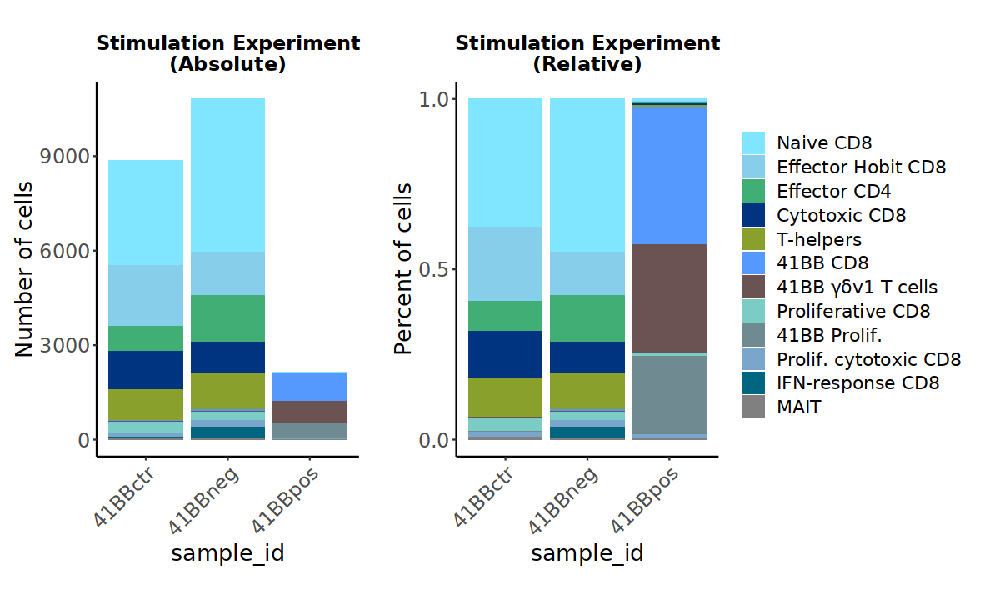

In [54]:
options(repr.plot.width = 10, repr.plot.height = 6, warn=-1,verbose = FALSE)
abs <- dittoBarPlot(seurat_obj, "annot", group.by = "sample_id", 
             scale = "count", retain.factor.levels=T, color.panel = exp_pal) + 
            labs(title ="Stimulation Experiment\n(Absolute)") + 
     theme(plot.title = element_text(hjust = 0.5, size = 14, face = "bold"),
           axis.text.x = element_text(size = 14),  
           axis.text.y = element_text(size = 14),
           text = element_text(size = 16),) + NoLegend()

rel <- dittoBarPlot(seurat_obj, "annot", group.by = "sample_id", 
             retain.factor.levels=T, color.panel = exp_pal) + 
            labs(title ="Stimulation Experiment\n(Relative)") + 
     theme(plot.title = element_text(hjust = 0.5, size = 14, face = "bold"),
           axis.text.x = element_text(size = 14),  
           axis.text.y = element_text(size = 14),
           text = element_text(size = 16),) +
      theme(plot.margin = margin(20, 20, 20, 20))
abs + rel

In [55]:
options(repr.plot.width = 6, repr.plot.height = 6, warn=-1,verbose = FALSE)
pf <- DimPlot(seurat_obj, group.by="sample_id")

In [56]:
pv <- VlnPlot(seurat_obj, features= "TNFRSF9",  group.by="sample_id") + 
    labs(title ="TNFRSF9 (41BB)") + 
     theme(plot.title = element_text(hjust = 0.5, size = 14, face = "bold"),
           axis.text.x = element_text(size = 14),  
           axis.text.y = element_text(size = 14),
           text = element_text(size = 16))

In [57]:
fp <- FeaturePlot(seurat_obj, features = "TNFRSF9", order=T, reduction="umap")

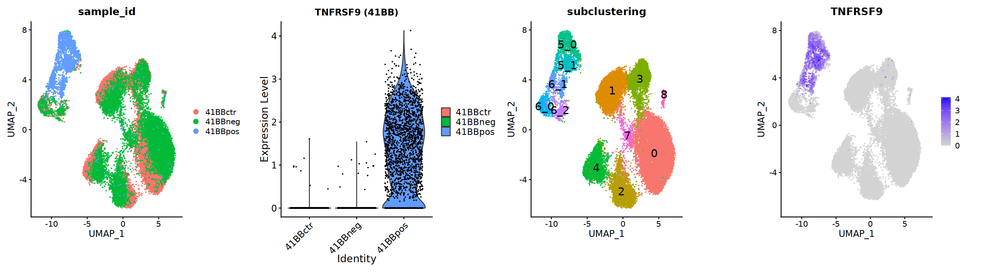

In [58]:
options(repr.plot.width = 22, repr.plot.height =6, warn=-1,verbose = FALSE)
# show plots
cp <- cowplot::plot_grid(plotlist = list(pf,pv,pc,fp),
                   align = "hv",
                   axis = "trbl",
                   ncol = 4,
                   nrow = 1)
cp

## Save

In [59]:
seurat_obj$annot <- Idents(seurat_obj)

In [60]:
seurat_obj@meta.data <- seurat_obj@meta.data[c('orig.ident','nCount_RNA','nFeature_RNA',
                       'sample_id','pct_mt','percent.ribo',
                       'doublet_score','doublet_pred','S.Score',
                       'G2M.Score','Phase', 'clusters', 'annot')]

In [61]:
source(here::here("SCGRES_124_125/sc_analysis/misc/paths.R"))
saveRDS(seurat_obj, here(glue("{annot}/{robj_dir}/4.0.1-Annotation_Exp2.rds")))

## Session Info

In [62]:
sessionInfo()

R version 4.1.1 (2021-08-10)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: CentOS Linux 7 (Core)

Matrix products: default
BLAS/LAPACK: /home/groups/singlecell/isentis/conda_envs/ines_r4.1.1c/lib/libopenblasp-r0.3.24.so

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=es_ES.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=es_ES.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=es_ES.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=es_ES.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] stats4    stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] scran_1.22.1                scater_1.22.0              
 [3] scuttle_1.4.0               SingleCellExperiment_1.16.0
 [5] SummarizedExperiment_1.24.0 Biobase_2.54.0             
 [7] GenomicRanges_1.46.1        GenomeInfoDb_1.30.1        
 [9] IRanges_2.28.0    